# Autoencoder Neural Network
## Final Project - Introduction to Machine Learning and Neural Networks

This project is prepared as a final project for Introduction to Machine Learning and Neural Networks course at Poznan University of Technology.
Teacher: dr. Paweł Pietrzak, PUT
Project prepared by Karol Wesołowski and Stefan Zbąszyniak
Poznan, Winter Semester 2023/24

## 1. Introduction

The goal of this project is to implement and test a simple autoencoder neural network, that will take gray-scale images as an input and color them. This task is done using python with TensorFlow library.

The neural network is trained using well-known cifar10 dataset, published in Keras library. It is a set of 6.000 small (32x32 px) pictures, categorized into 10 classes. As the encoder does not make any use of those classes, they are not interpreted in this project. Every image is in full color, therefore they will have to be converted to gray-scale. Small distribution of topics present on the graphics may lead to overspecification of the neural network and therefore may force us to change the training set to more diverse cifar100.



## 2. Implementation
### 2.1 Preparation
First step in the implementation is defining used libraries and constant settings. Numpy is used for data storing and math operations, cv2 is an implementation of OpenCV module, responsible for computer vision and manipulation on images (like turing gray-scale). Rest is various parts of Keras TensorFlow:
* dataset
* default definition of the model
* layers definition and additional features
* optimizers (the default Adam and Adam with weight decay implementation)
* learning rate reducer for improved stop condition

All generated graphs and pictures will be presented in the same size of 12 by 8 with resolution 100 dots per inch.

In [1]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import  Model
from tensorflow.keras.layers import  Dropout, BatchNormalization, Conv2D, Conv2DTranspose
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.callbacks import ReduceLROnPlateau

plt.rc('figure', figsize=(12, 8), dpi=100)

### 2.2 Loading data

Data is loaded from the cifar10 dataset. It originally contains four arrays: two involving train set and two for test set. Those arrays are description of images (32x32 px x 3 color channels - originally denoted with X) and labels of the images (originally Y). As the labels are redundant for the problem at hand they are omitted by using discard variables (denoted as underscore). Those sets will serve as labels in this problem. Data contained in color channels is written as integers in the range 0 to 255. They have to be converted into understood by machine floats and therefore are divided by 255.
Features part of the datasets are generated using  `cv.ctvColor` function and converted into gray-scale. This also results in the loss of dimensions, instead of original 3, there will be only one variable at the last element of array (gray intensity). Data is checked for correctness using `np.shape` function.

In [2]:
(y_train, _), (y_test, _) = cifar10.load_data() # loading the dataset

170498071/170498071 [==============================] - 3s 0us/step


In [3]:
y_train = y_train.astype('float32') / 255  # casting to floats
y_test = y_test.astype('float32') / 255
x_train = np.expand_dims([cv.cvtColor(x, cv.COLOR_RGB2GRAY) for x in y_train], axis=3)  # turning gray
x_test = np.expand_dims([cv.cvtColor(x, cv.COLOR_RGB2GRAY) for x in y_test], axis=3)
print('Shape of x train set:', x_train.shape)
print('Shape of y train set:', y_train.shape)
print('Shape of x test set:', x_test.shape)
print('Shape of y test set:', y_test.shape)

Shape of x train set: (50000, 32, 32, 1)
Shape of y train set: (50000, 32, 32, 3)
Shape of x test set: (10000, 32, 32, 1)
Shape of y test set: (10000, 32, 32, 3)


To check if pictures are converted correctly, one (exemplary) is taken from the set and visualized.

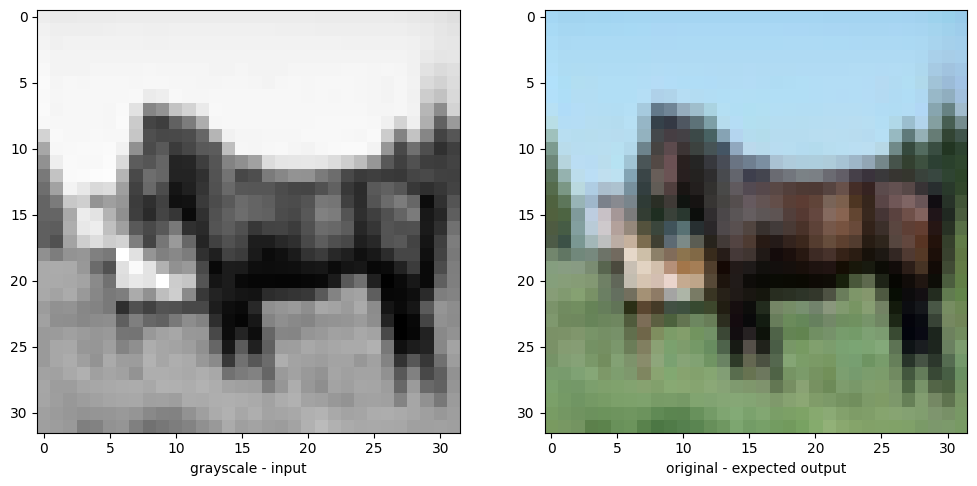

In [4]:
fig, (ax1, ax2) = plt.subplots(ncols=2)
ax1.imshow(x_train[12].reshape(32, 32), cmap='gray')
ax2.imshow(y_train[12])
ax1.set_xlabel('grayscale - input')
ax2.set_xlabel('original - expected output')
plt.show()

### 2.3 Model
All parts of the defined model inherit their bases from `tensorflow.keras.model.Model` and are designed as separate classes.        


#### 2.3.1 Encoder
This object has two defined by user features:
1. name - set for 'Encoder', in practice any single word would do. This is the variable that is necessary for proper implementation of inheritance and super constructor.
2. myLayers - list containing definitions of layers, by default empty.

Besides that, the constructor takes also four arguments
1. filter - list of numbers, defining the size (number of dimensions) of each layer
2. kernel - size of a convolution window
3. dropout - rate of dropout, if defined it will become an additional layer in the network
4. batch_norm - boolean, if defined the network will have additional layer for batch normalisation.

This object is used only to create a new network. It has one defined function: `call`, which takes one parameter `x`, describing the current input, and pushes it through the network.

In [5]:
class Encoder(Model):
  def __init__(self, filters, kernel, dropout, batch_norm):
    super().__init__(name='Encoder')
    self.myLayers = []
    for n in filters:
      self.myLayers.append(Conv2D(filters=n, kernel_size=kernel, strides=2, activation='relu', padding='same'))
      if batch_norm: self.myLayers.append(BatchNormalization())
      if dropout: self.myLayers.append(Dropout(dropout))

  def call(self, x):
    for layer in self.myLayers:
      x = layer(x)
    return x


#### 2.3.2 Decoder
Decoder is defined in a very similar manner as the encoder. It has two features: `name` and `myLayer`, described above. The constructor takes three values: `filters` and `kernel` are explained above, `channels` describes the number of output channels, and is set to constant 3, as this is the number of colors (red, green and blue) expected in the output.
Function `call` pushes data through the network.

In [6]:
class Decoder(Model):
  def __init__(self, filters, kernel, channels=3):
    super().__init__(name='Decoder')
    self.myLayers = []
    for n in filters:
      self.myLayers.append(Conv2DTranspose(filters=n, kernel_size=kernel, strides=2, activation='relu', padding='same'))
    self.myLayers.append(Conv2D(filters=channels, kernel_size=kernel, activation='sigmoid', padding='same'))

  def call(self, x):
    for layer in self.myLayers:
      x = layer(x)
    return x

#### 2.3.3 Autoencoder
This class collects the two defined above and makes them work in proper manner. The constructor takes multiple arguments, most of which are used in the derived constructors of Encoder and Decoder. Besides, it takes `name` and `weight`. The latter defines if the model should use weights decay, and so, which optimizer to use in the next step.
Function `call` is analogous to the one in other Model-derived classes.

In [7]:
class Autoencoder(Model):
  def __init__(self, name, filters, kernel=3, dropout=None, batch_norm=False, weight=False):
    super().__init__(name= name)
    self.encoder = Encoder(filters, kernel, dropout, batch_norm)
    self.decoder = Decoder(filters[::-1], kernel)
    self.weight = weight

  def call(self, x):
    x = self.encoder(x)
    x = self.decoder(x)
    return x

#### 2.3.4 Utilities
There are two additional functions needed for proper work of the network.
1. fit_models - This function takes as a parameter list of defined models and executes them. The optimizer is chosen based on the `weight` parameter (choices are Adam or AdamW). Learning rate is set to constant 1/100. Model is compiled with the selected optimizer and loss function of Mean Square Error. Model is than fit, using train data and defined callback reducer. The algorithm will work for 20 epochs. the history is saved in the `history` feature of the model.
2. plot_training is used to show the progress of training. It generates a graph showing, for given model (attribute `models`), changes on given parameter (attribute `param`).

In [8]:
def fit_models(models):
  for model in models:
    print(f'--- {model.name} ---')
    if model.weight:
      optimizer = AdamW(learning_rate=0.01)
    else:
      optimizer = Adam(learning_rate=0.01) # można zmienić
    model.compile(optimizer=optimizer, loss='mse')
    reduce_lr = ReduceLROnPlateau(patience=2, factor=0.5, min_lr=1e-6, verbose=1)
    model.history = model.fit(x_train, y_train, epochs=20, batch_size=128, validation_data=(x_test, y_test), callbacks=[reduce_lr])

def plot_training(models, params):
  fig, axs = plt.subplots(ncols=len(params), figsize=(12, 5))
  labels = [x.name for x in models]
  for ax, param in zip(axs.reshape(-1), params):
    for model in models:
      ax.plot(model.history.history[param])
    ax.set_ylabel(param)
    ax.set_xlabel('epoch')
    ax.legend(labels, loc='upper right')
  plt.show()

### 2.4 Training
There is 8 prepared models, differing on three parameters:
1. batch normalisation
2. dropout rate
3. weight decay
Kernel size and sizes of filters are also defined here. Every model is fit. This process takes the longest , around 70 seconds per epoch, which accumulates to little over 3 hours.

In [9]:
filters_s = [64, 128, 256]
kernel_s = 3
models = [
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=False, dropout=False, name='small'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=True, dropout=False, name='small_batchnorm'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=False, dropout=0.2, name='small_dropout'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=True, dropout=0.2, name='small_batchnorm_dropout'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=False, dropout=False, weight=True, name='small_weights'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=True, dropout=False, weight=True, name='small_batchnorm_weights'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=False, dropout=0.2, weight=True, name='small_dropout_weights'),
  Autoencoder(filters=filters_s, kernel=kernel_s, batch_norm=True, dropout=0.2, weight=True, name='small_batchnorm_dropout_weights'),
]
fit_models(models)

--- small ---
Epoch 1/20
391/391 [==============================] - 20s 32ms/step - loss: 0.0173 - val_loss: 0.0097 - lr: 0.0100
Epoch 2/20
391/391 [==============================] - 10s 26ms/step - loss: 0.0092 - val_loss: 0.0088 - lr: 0.0100
Epoch 3/20
391/391 [==============================] - 11s 28ms/step - loss: 0.0086 - val_loss: 0.0086 - lr: 0.0100
Epoch 4/20
391/391 [==============================] - 10s 26ms/step - loss: 0.0083 - val_loss: 0.0080 - lr: 0.0100
Epoch 5/20
391/391 [==============================] - 11s 28ms/step - loss: 0.0079 - val_loss: 0.0079 - lr: 0.0100
Epoch 6/20
391/391 [==============================] - 11s 27ms/step - loss: 0.0077 - val_loss: 0.0076 - lr: 0.0100
Epoch 7/20
391/391 [==============================] - 10s 27ms/step - loss: 0.0075 - val_loss: 0.0073 - lr: 0.0100
Epoch 8/20
391/391 [==============================] - 11s 28ms/step - loss: 0.0073 - val_loss: 0.0072 - lr: 0.0100
Epoch 9/20
391/391 [==============================] - 11s 28ms/ste

The training history is presented.

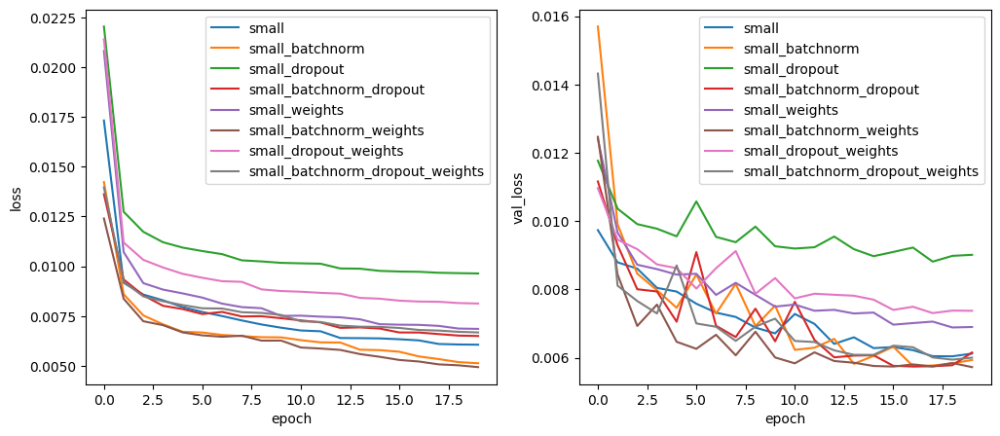

In [10]:
plot_training(models, params=['loss', 'val_loss'])

Models are used to predict a sample (100) images' colorings. The shape of achieved structure is printed to check for sanity.

In [11]:
predicted = [model.predict(x_test[:100, :, :, :]) for model in models]


4/4 [==============================] - 0s 3ms/step


### 2.5 Plotting
Function `plot_result` is used to plot images output by trained models. This function will produce multiple rows of three images: one in gray-scale, one colored by the network and one original. The same logic applies to `plot_disk_image` function, which serves as a wrapper for the beforementioned function, with application to images loaded from disk. They are first turned gray, and then plotted.

In [12]:
def plot_result(x, y, Y):
  fig, (ax1, ax2, ax3) = plt.subplots(ncols=3)
  ax1.imshow(x.reshape(x.shape[0], x.shape[1]), cmap='gray')
  ax2.imshow(Y)
  ax3.imshow(y)
  ax1.set_xlabel('grayscale - input')
  ax2.set_xlabel('color - output')
  ax3.set_xlabel('color - expected')
  plt.show()

def plot_disk_image(model, path):
  y = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB).astype('float32') / 255
  x = cv.cvtColor(y, cv.COLOR_RGB2GRAY)
  Y = model.predict(x.reshape(1, x.shape[0], x.shape[1], 1))[0]
  plot_result(x, y, Y)



## 3. Results
None of the trained networks achieved the perfect result. Most of the outcome images are more bleached than the original ones. There is a high tendency to favour sepia (shades of brown). Some models (in general those, that uses dropout layer) produce very blured images. Subjectively the best result was obtained by `small_batchnorm_weights` model. The colors are far from the original, but the contrast between them was kept, and so the resulting image remained sharp

small


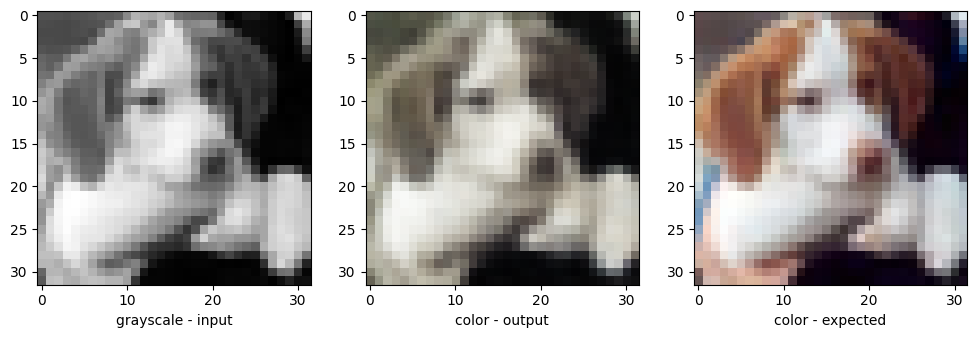

small_batchnorm


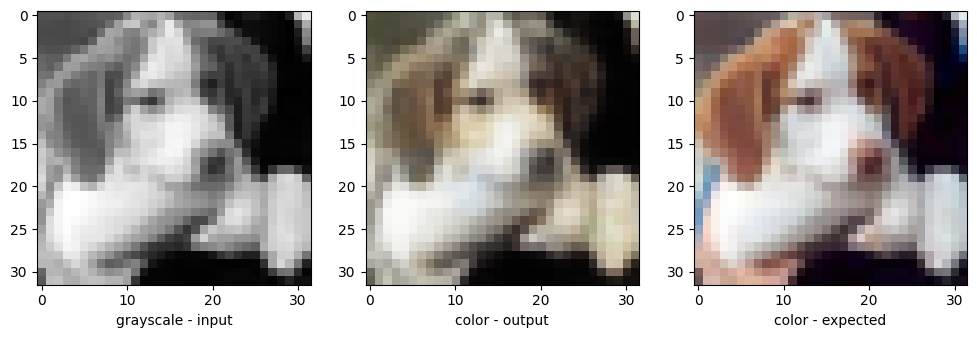

small_dropout


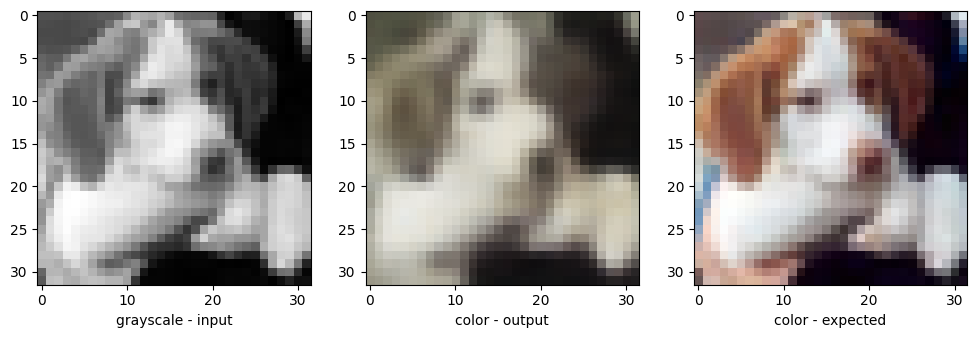

small_batchnorm_dropout


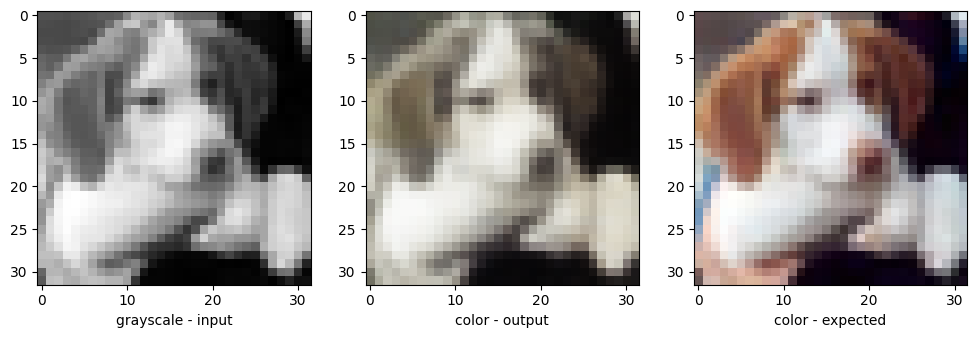

small_weights


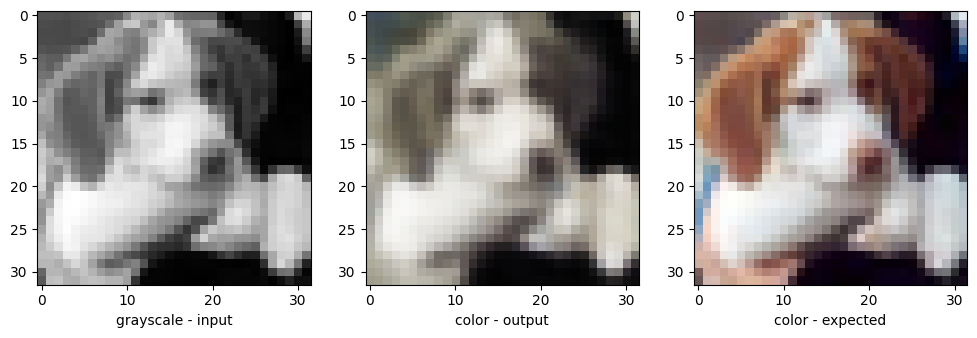

small_batchnorm_weights


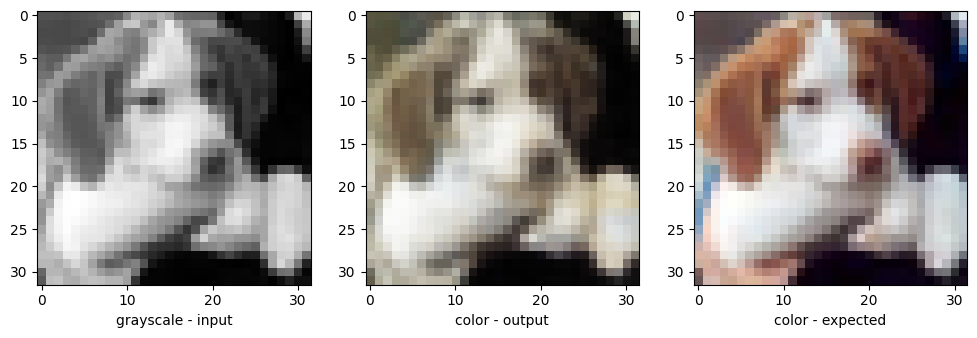

small_dropout_weights


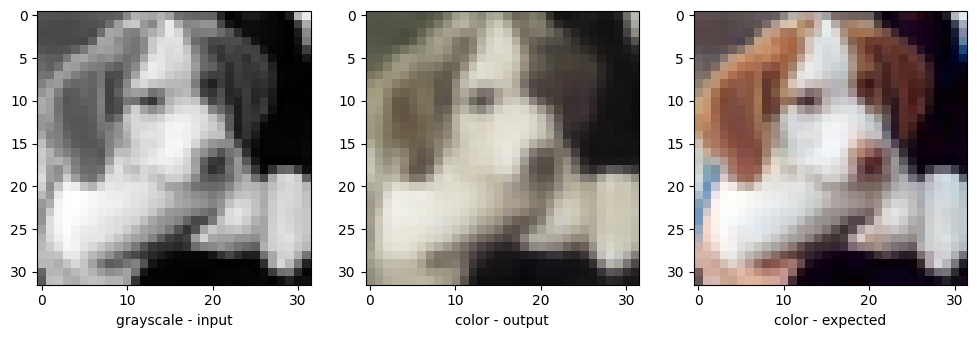

small_batchnorm_dropout_weights


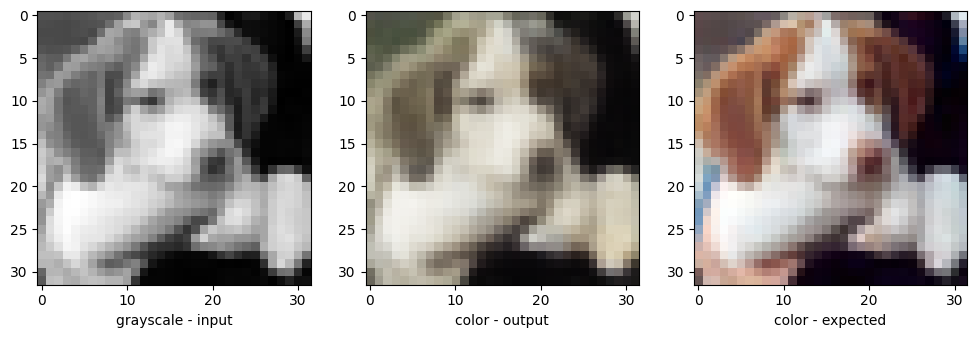

In [13]:
for i in range(len(models)):
  print(models[i].name)
  plot_result(x_test[16], y_test[16], predicted[i][16])


small
1/1 [==============================] - 4s 4s/step


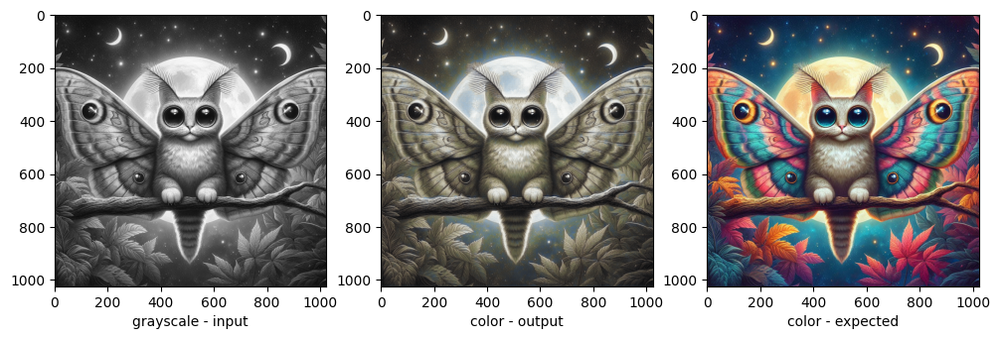

small_batchnorm


1/1 [==============================] - 0s 200ms/step


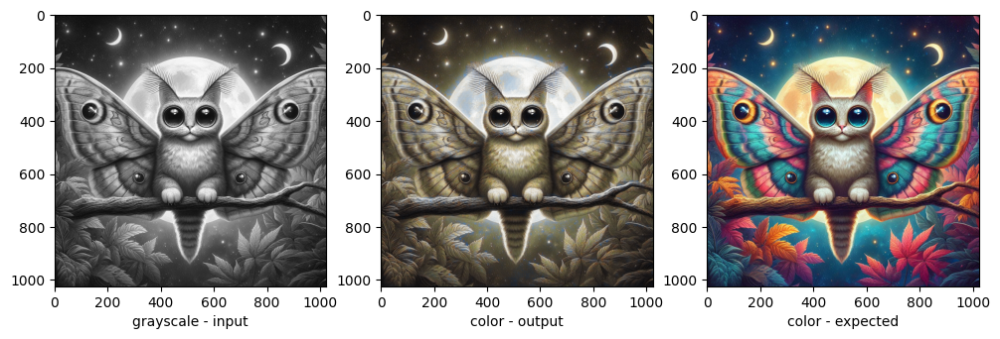

small_dropout


1/1 [==============================] - 0s 177ms/step


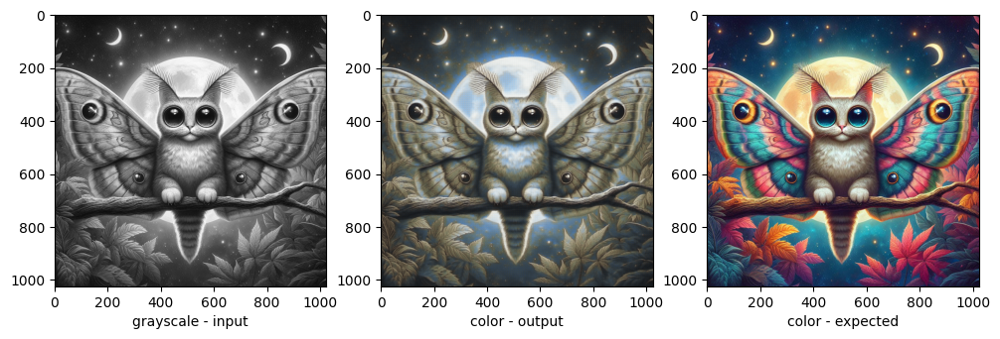

small_batchnorm_dropout
1/1 [==============================] - 0s 277ms/step


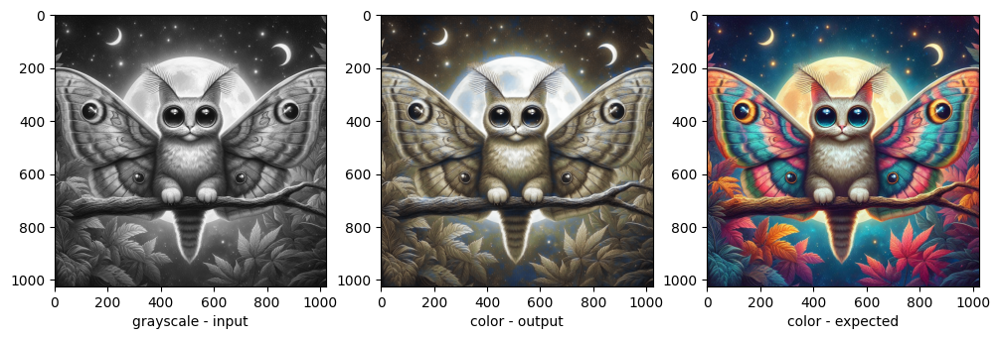

small_weights
1/1 [==============================] - 0s 247ms/step


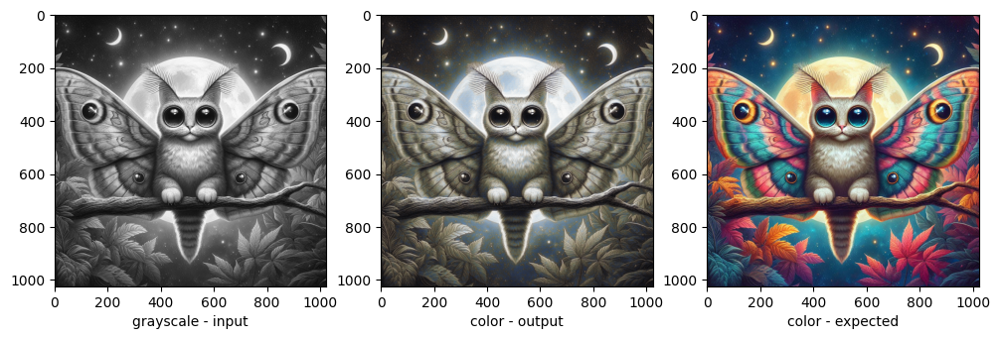

small_batchnorm_weights
1/1 [==============================] - 0s 221ms/step


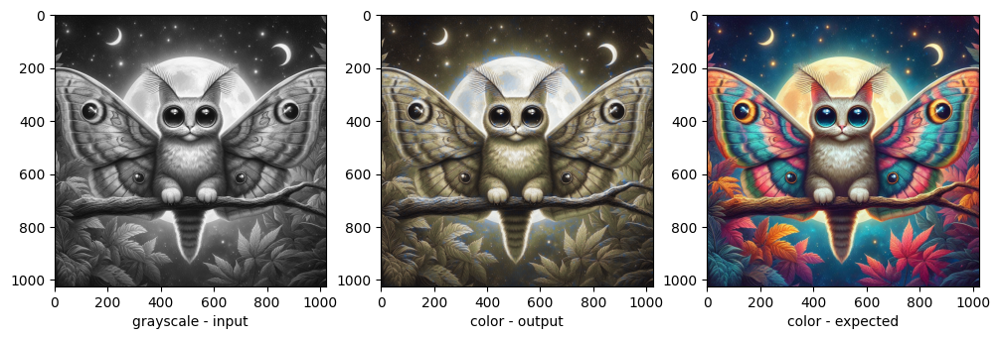

small_dropout_weights
1/1 [==============================] - 0s 189ms/step


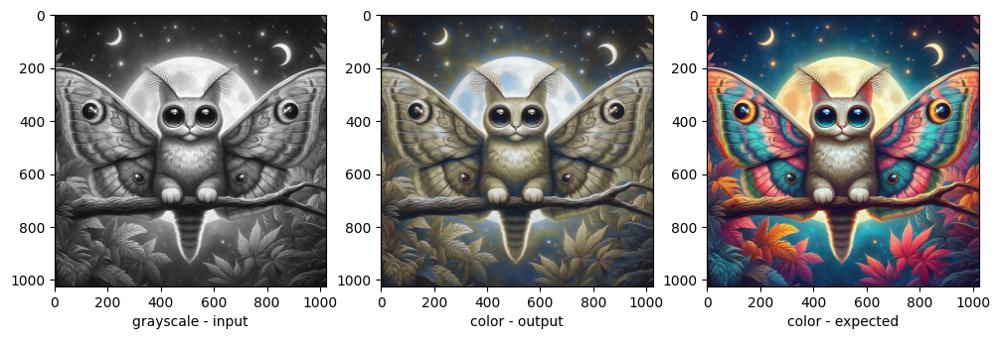

small_batchnorm_dropout_weights
1/1 [==============================] - 0s 214ms/step


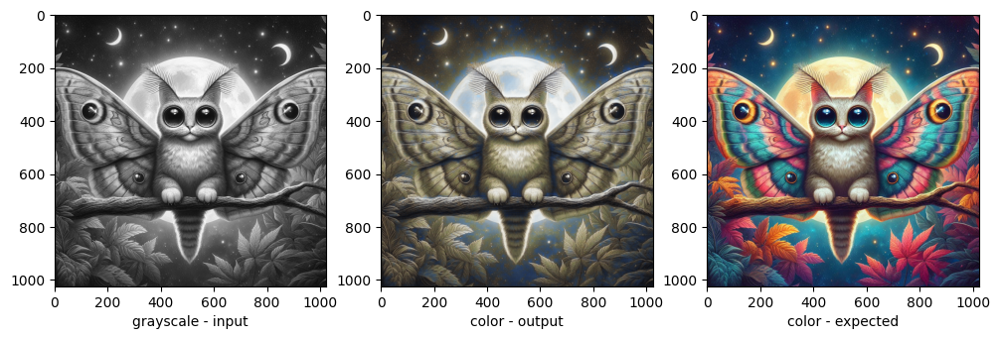

In [15]:
for i in range(len(models)):
  print(models[i].name)
  plot_disk_image(models[i], 'graphics/catmoth.jpg')

Testing it on the bigger (1024x1024 px) image, it can be observed, that models implementing dropout layer use much more blue in the outcome, than the other, which keep results in brown-scale. It is worth noting, that the input image is very bright and unrealistically colored, while the results become more real-like (in terms of colors

small
1/1 [==============================] - 1s 1s/step


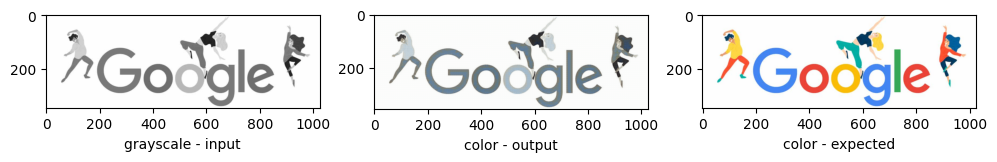

small_batchnorm
1/1 [==============================] - 0s 21ms/step


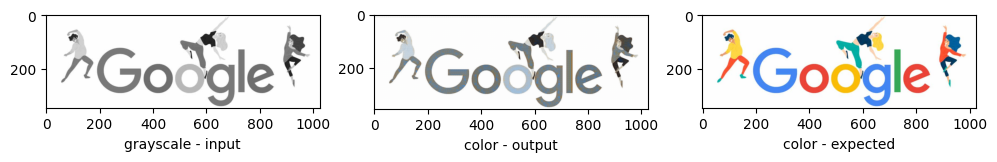

small_dropout
1/1 [==============================] - 0s 20ms/step


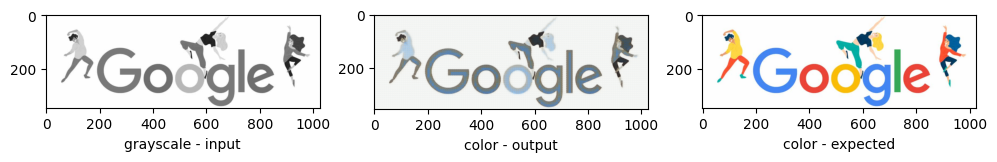

small_batchnorm_dropout
1/1 [==============================] - 0s 20ms/step


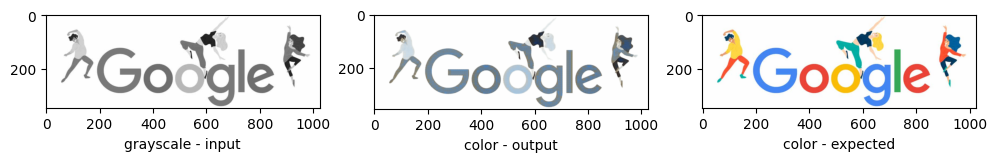

small_weights
1/1 [==============================] - 0s 21ms/step


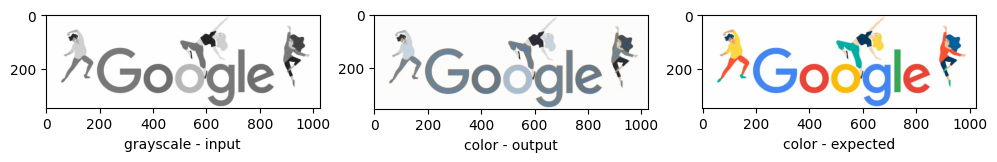

small_batchnorm_weights
1/1 [==============================] - 0s 20ms/step


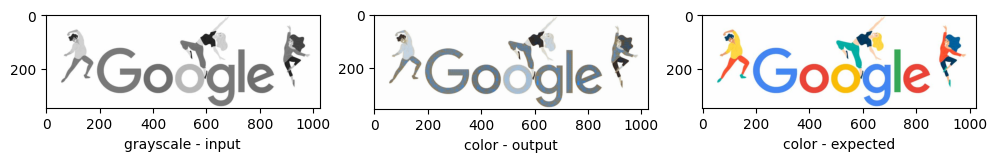

small_dropout_weights
1/1 [==============================] - 0s 20ms/step


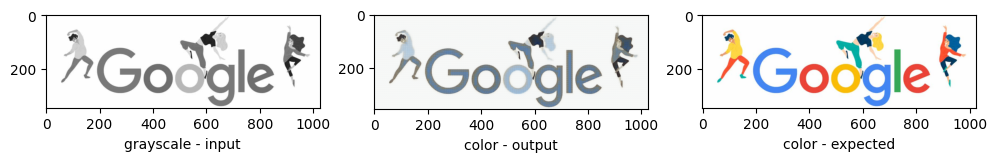

small_batchnorm_dropout_weights
1/1 [==============================] - 0s 20ms/step


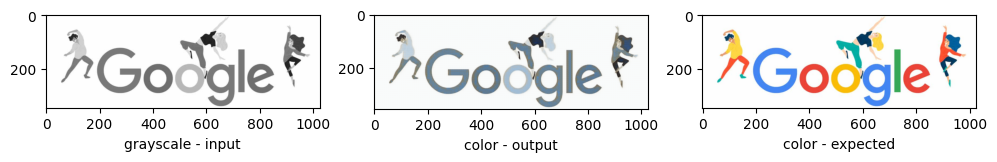

In [16]:
for i in range(len(models)):
  print(models[i].name)
  plot_disk_image(models[i], 'graphics/google-dance.jpg')

For an abstract graphic, that has no connection to the training set (does not contain animals) the results are poor and equally bad on every model.

small
1/1 [==============================] - 18s 18s/step


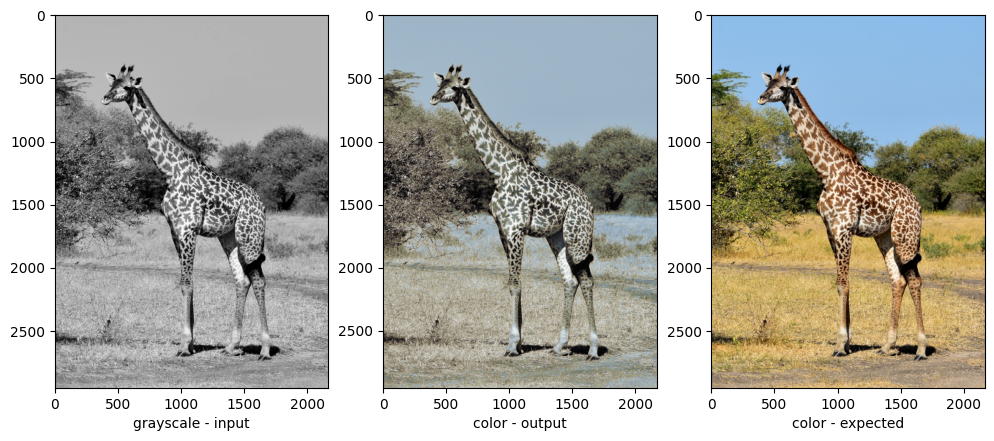

small_batchnorm
1/1 [==============================] - 0s 37ms/step


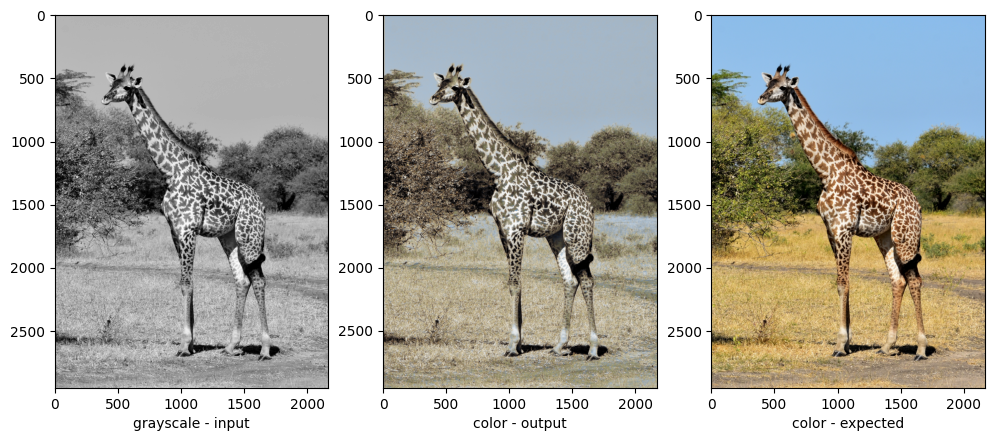

small_dropout
1/1 [==============================] - 0s 38ms/step


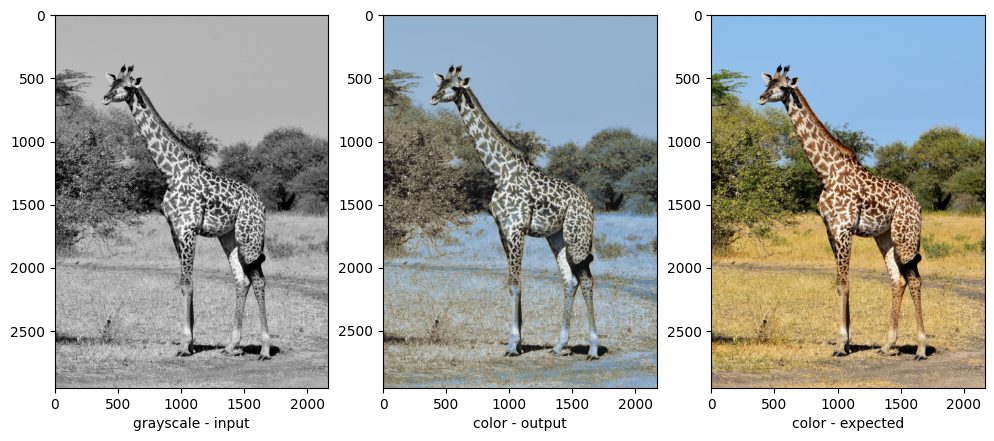

small_batchnorm_dropout
1/1 [==============================] - 0s 38ms/step


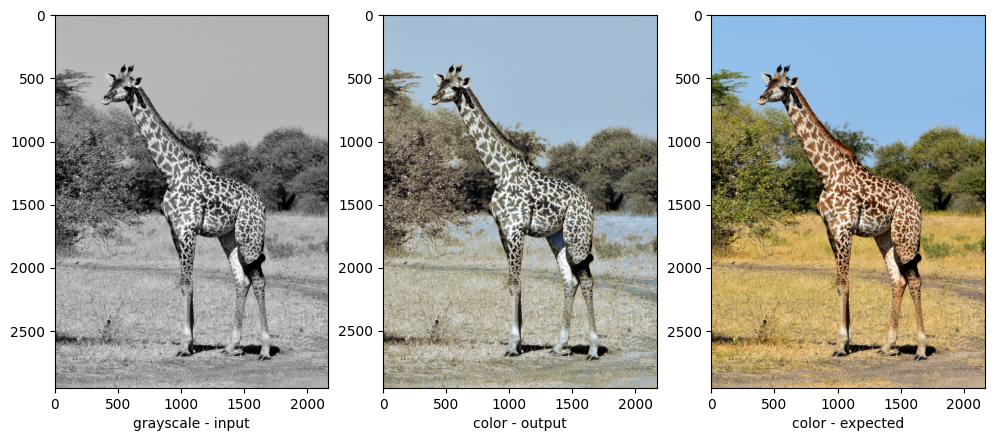

small_weights
1/1 [==============================] - 0s 70ms/step


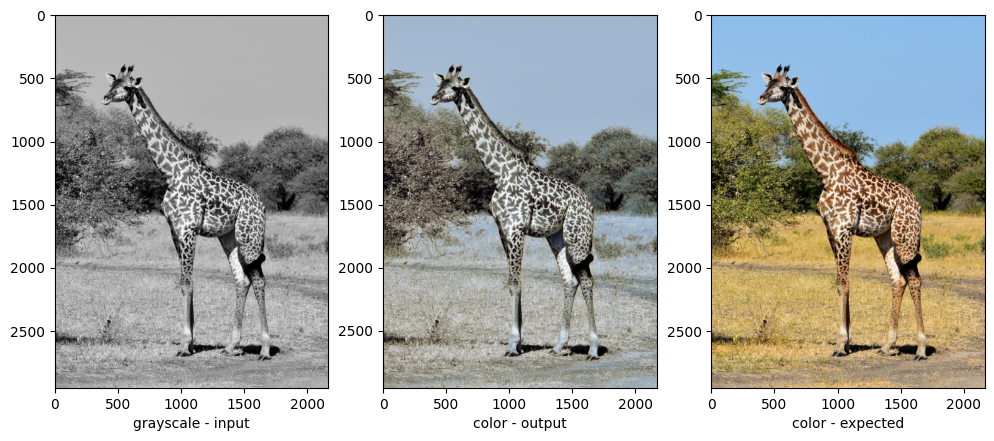

small_batchnorm_weights
1/1 [==============================] - 0s 38ms/step


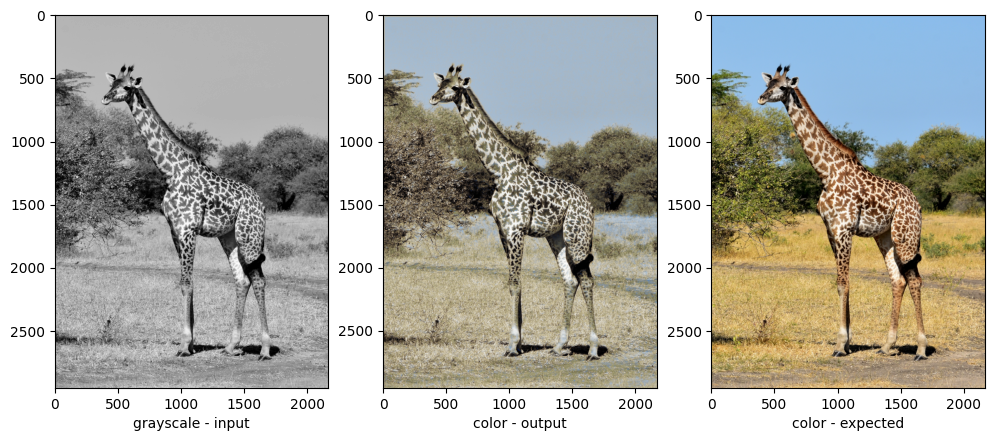

small_dropout_weights
1/1 [==============================] - 0s 44ms/step


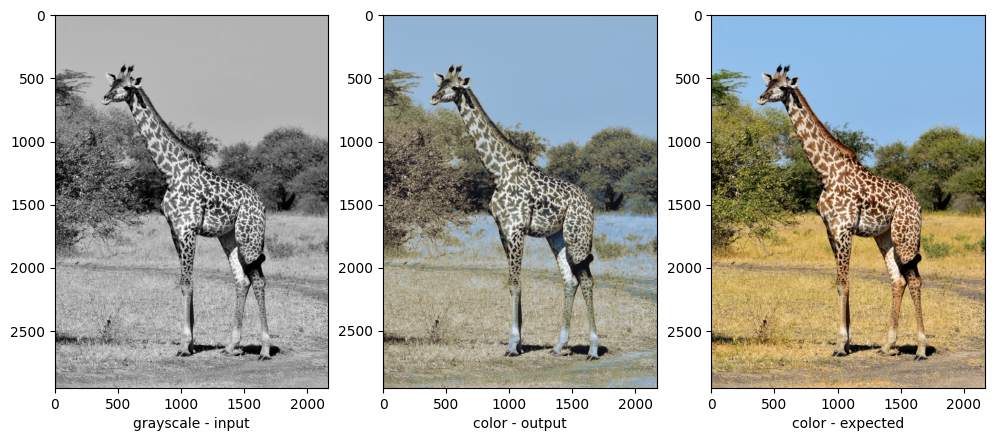

small_batchnorm_dropout_weights
1/1 [==============================] - 0s 55ms/step


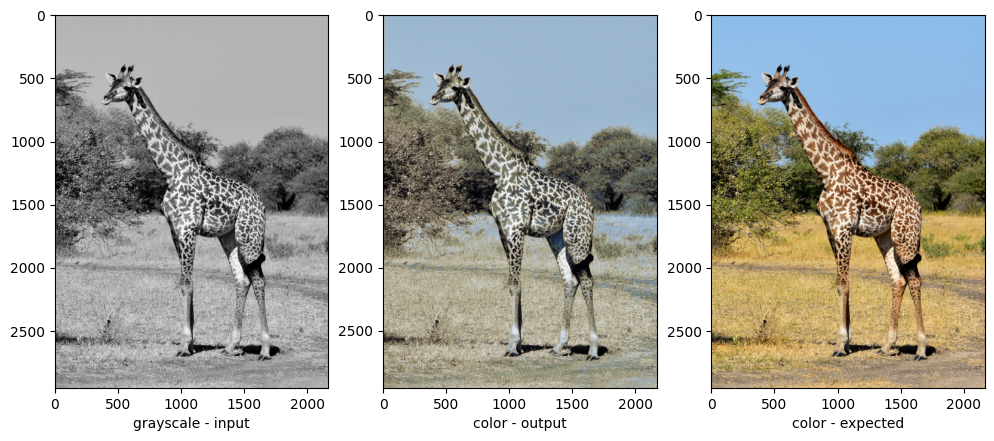

In [17]:
for i in range(len(models)):
  print(models[i].name)
  plot_disk_image(models[i], 'graphics/giraffe.jpg')

Using real-life photography of an animal we can verify, that again, `batchnorm_weights` produces the best outcome. Models with dropout layer gives too much blue and make the outcome unrealistic.

small
1/1 [==============================] - 0s 36ms/step


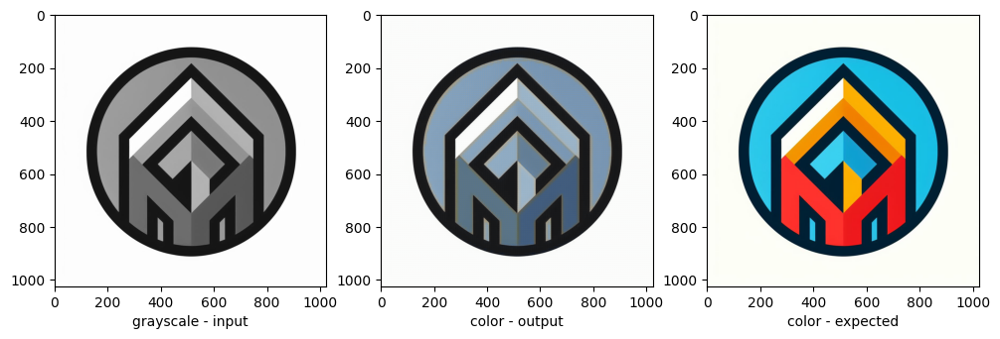

small_batchnorm
1/1 [==============================] - 0s 20ms/step


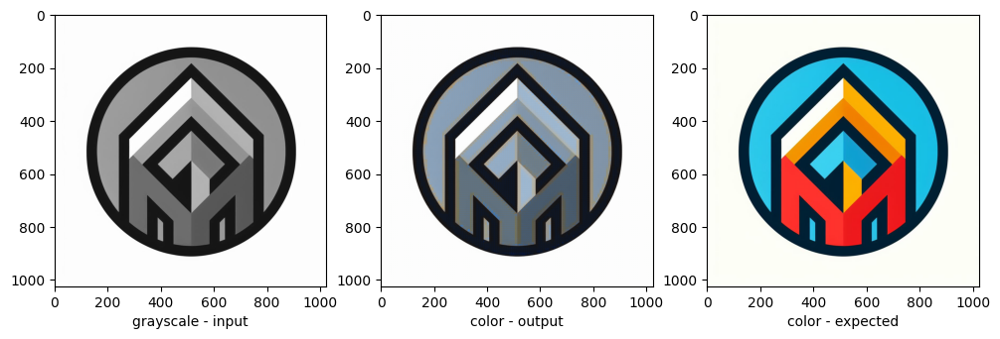

small_dropout
1/1 [==============================] - 0s 22ms/step


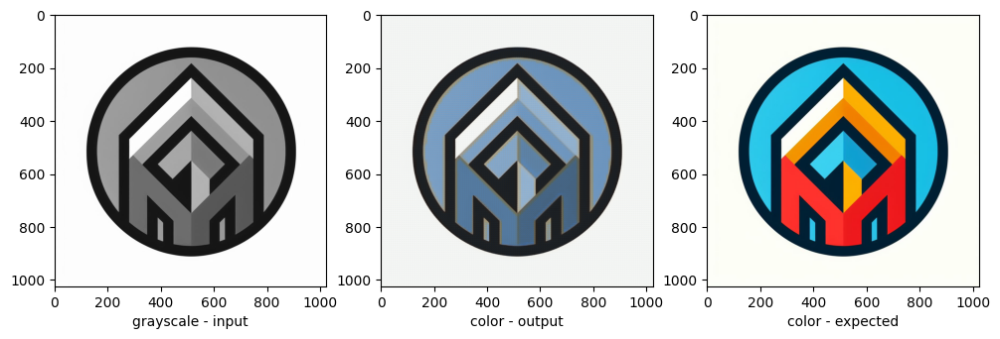

small_batchnorm_dropout
1/1 [==============================] - 0s 22ms/step


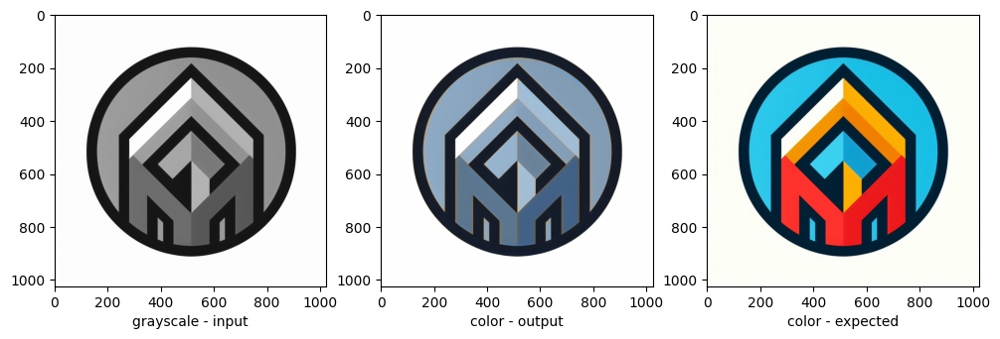

small_weights
1/1 [==============================] - 0s 30ms/step


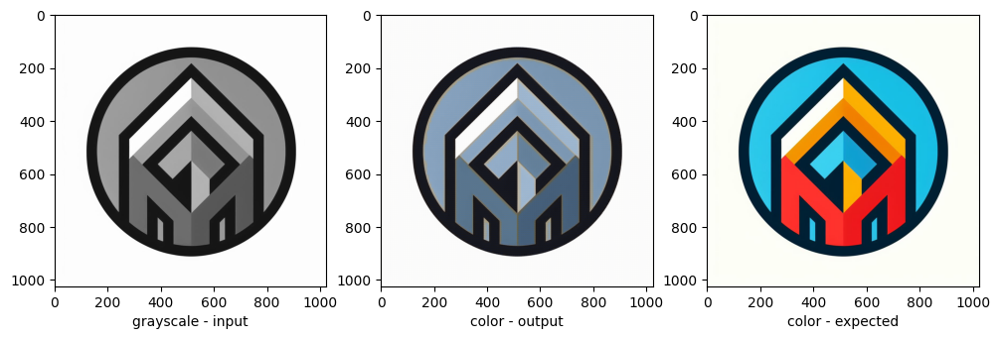

small_batchnorm_weights
1/1 [==============================] - 0s 22ms/step


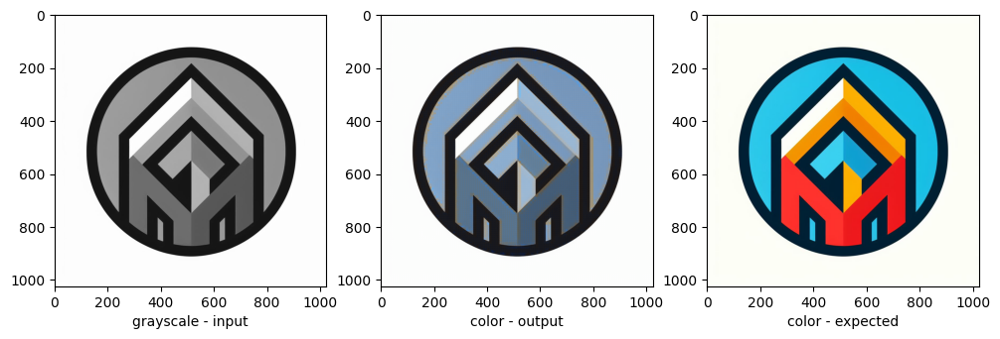

small_dropout_weights
1/1 [==============================] - 0s 22ms/step


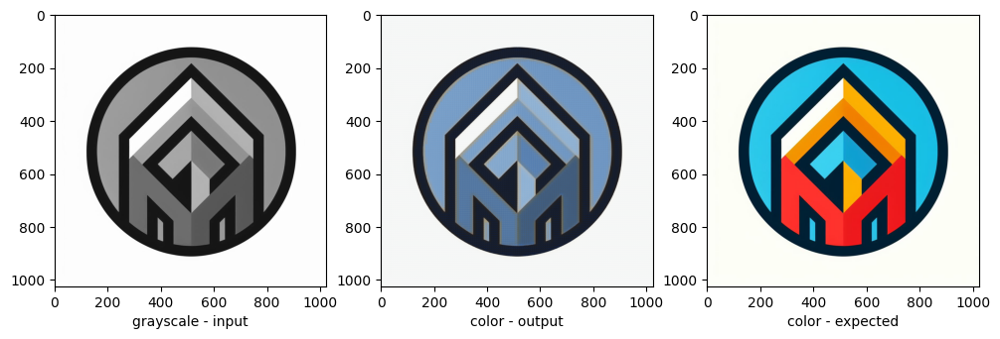

small_batchnorm_dropout_weights
1/1 [==============================] - 0s 21ms/step


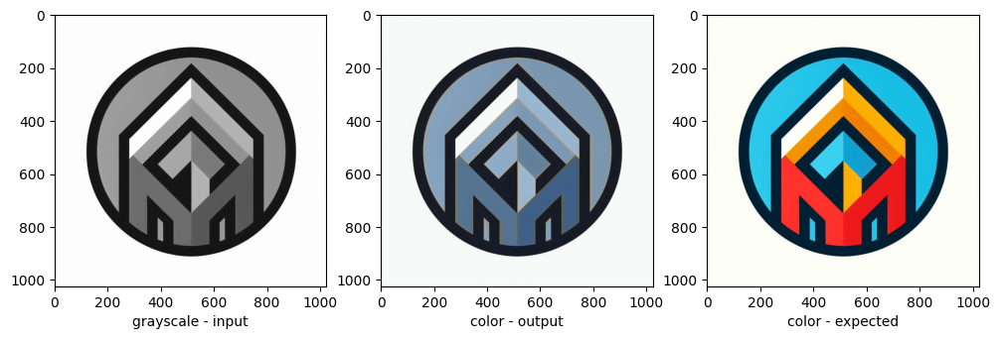

In [18]:
for i in range(len(models)):
  print(models[i].name)
  plot_disk_image(models[i], 'graphics/simple-icon.jpg')

Again, feeding the model with completely abstract graphic gives unsatisfying results.

small
1/1 [==============================] - 0s 445ms/step


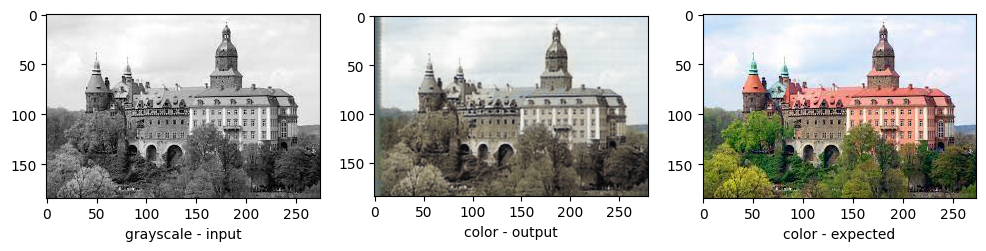

small_batchnorm
1/1 [==============================] - 0s 31ms/step


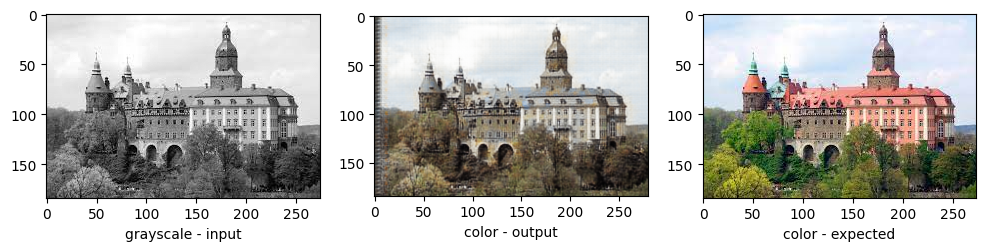

small_dropout
1/1 [==============================] - 0s 26ms/step


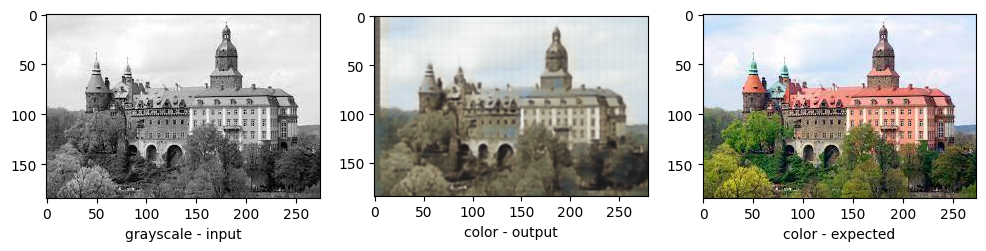

small_batchnorm_dropout
1/1 [==============================] - 0s 26ms/step


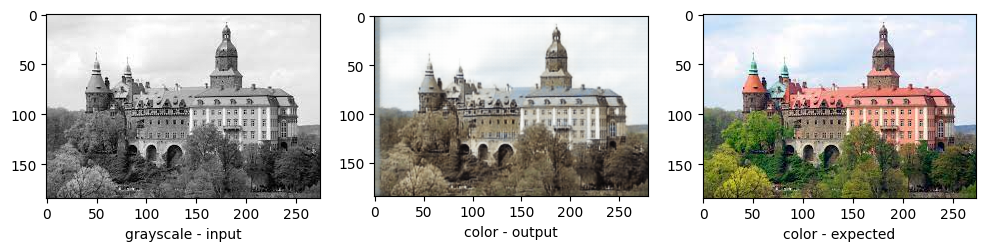

small_weights
1/1 [==============================] - 0s 26ms/step


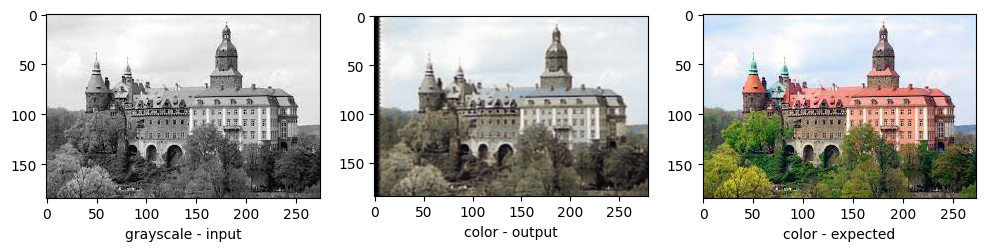

small_batchnorm_weights
1/1 [==============================] - 0s 35ms/step


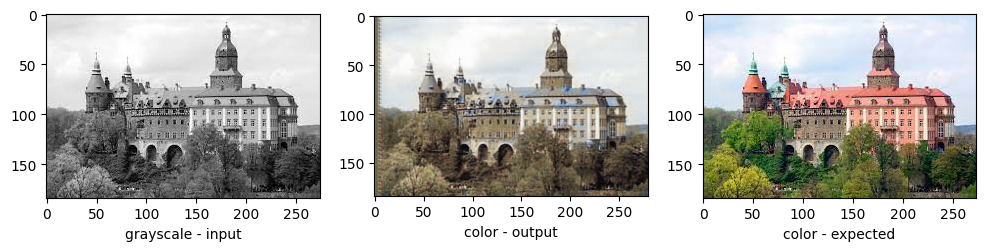

small_dropout_weights
1/1 [==============================] - 0s 25ms/step


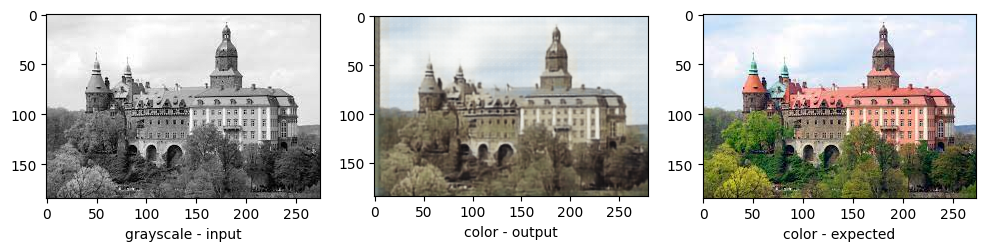

small_batchnorm_dropout_weights
1/1 [==============================] - 0s 26ms/step


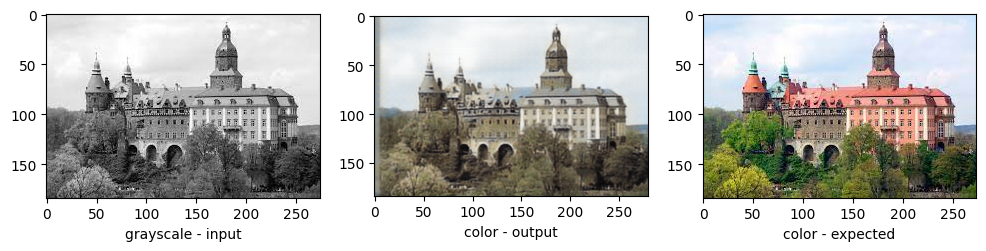

In [19]:
for i in range(len(models)):
  print(models[i].name)
  plot_disk_image(models[i], 'graphics/castle.jpg')

After the last test on landscape photo it can be seen, that, again dropout layer tends to favour blue channel in the output, but at the cost of sharpness. The best result was obtained by using `batchnorm_weights` model, even though the colors are still bleached.

### 3.1 Field for improvement
There is still some features of the model, that were not tested due to high time consumption of the process. The result shows, that dropout rate is a parameter that could be omitted in the future experiments. There exists a possibility, that training the model on different dataset (for example more diverse cifar100) could result in producing better outcomes.
Authors don't think, that running training for more epochs is worth the time, since, as it can be seen on the loss graphs, the improvement in each epoch is getting smaller. It is although possible, that adding an extra layer into the network, could improve the outcome.

## 4. Endnotes
Written for Introduction to Machine Learning and Neural Networks course, thought on Poznan University of Technology, by Paweł Pietrzak.
Written and tested by Karol Wesołowski (148116) and Stefan Zbąszyniak (148078).
Coded in Python 3.11, using JetBrains PyCharm 2023.3, tested under Windows 10. Report written in Markdown.
Sources of graphics:
* keras cifar10 dataset
* bing ai autogenerated graphics
* google
* wikipedia

Poznan, Winter Semester 2023/24